# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [2]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
from functools import cmp_to_key
%matplotlib inline

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


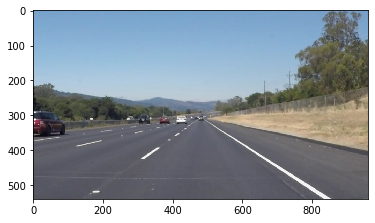

In [3]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images  
`cv2.cvtColor()` to grayscale or change color  
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

In [4]:
import os
os.listdir("test_images/")

['solidWhiteCurve.jpg',
 'solidWhiteRight.jpg',
 'solidYellowCurve.jpg',
 'solidYellowCurve2.jpg',
 'solidYellowLeft.jpg',
 'whiteCarLaneSwitch.jpg']

In [5]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images_output directory.
images =['solidWhiteCurve.jpg',
         'solidWhiteRight.jpg',
         'solidYellowCurve.jpg',
         'solidYellowCurve2.jpg',
         'solidYellowLeft.jpg',
         'whiteCarLaneSwitch.jpg']

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [6]:
import math
import numpy.polynomial.polynomial as poly

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image
 
def draw_lines_v1(img, lines, color=[255, 0, 0], thickness=2, debug = False):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    try:
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(img, (x1, y1), (x2, y2), color, thickness)
    except Exception as e:
        pass
    return None

def draw_lines_v2(img, lines, color=[255, 0, 0], thickness=2,debug = False):
    """
    NOTE: this is or FIRST implementation the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    height, width, _ = img.shape
    camera_x       = width //2
    camera_y       = height
    min_theta      = 15.0
    max_theta      = 90.0
    line_min_dist  = 20
    left_lines     = []
    right_lines    = []
    other_lines    = []
    left_points    = []
    right_points   = []
    other_points   = []
    left_midpts    = []
    right_midpts   = []
    other_midpts   = []
    sort_on_y      = cmp_to_key(sort_by_y)
    y_offset_top   = 320
    y_offset_bottom= 540
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            delta_x = x2-x1
            delta_y = y2-y1
            x_mp    = x1 + (delta_x//2)
            y_mp    = y1 + (delta_y//2)            
            if delta_x != 0:
                slope   = delta_y / delta_x
                line_theta   = np.arctan(slope) * 180 / np.pi
            elif delta_y < 0:
                slope   = np.Infinity
                line_theta   = 90.0
            else:
                slope   = -np.Infinity
                line_theta   = -90.0
                
#             print('line: ', line[0], ' delta x: ', delta_x, 'delta y:', delta_y, ' tan(line_theta) = ', slope, ' line_theta: ' , line_theta)
#             cv2.line(img, (x1, y1), (x2, y2), color, thickness)

## Separate detected segments into left and right line segments
## only using slope of detected line
##
#         if max_theta >= line_theta > min_theta:
#             right_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             right_points.extend([[x1,y1],[x2,y2]])
#             right_midpts.append((x_mp, y_mp))
#         elif -max_theta < line_theta <= -min_theta: 
#             left_lines.append ([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             left_points.extend([[x1,y1],[x2,y2]])                
#             left_midpts.append((x_mp, y_mp))
#         else:
#             other_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             other_points.extend([[x1,y1],[x2,y2]])                
#             other_midpts.append((x_mp, y_mp))
            
            
## Separate detected segments into left and right line segments
## only using x_coordiantes of start/end of detected line segments
#
#         if (x1 > camera_x + line_min_dist) and (x2 > camera_x + line_min_dist):
#             right_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             right_points.extend([[x1,y1],[x2,y2]])
#             right_midpts.append([x_mp, y_mp])
#         elif (x1 < camera_x - line_min_dist) and (x2 < camera_x - line_min_dist):
#             left_lines.append ([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             left_points.extend([[x1,y1],[x2,y2]])                
#             left_midpts.append([x_mp, y_mp])
#         else:
#             other_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
#             other_points.extend([[x1,y1],[x2,y2]])                
#             other_midpts.append([x_mp, y_mp])
    
## Separate detected segments into left and right line segments
## using slope of detected line AND x_coordiantes of start/end 
## of detected line segments
##
        if (x1 > (camera_x + 20)) and (x2 > (camera_x + 20)) and  (max_theta >= line_theta > min_theta):
            right_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
            right_points.extend([[x1,y1],[x2,y2]])
            right_midpts.append((x_mp, y_mp))
        elif (x1 < (camera_x - 20)) and (x2 < (camera_x - 20)) and (-max_theta < line_theta <= -min_theta):
            left_lines.append ([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
            left_points.extend([[x1,y1],[x2,y2]])                
            left_midpts.append((x_mp, y_mp))
        else:
            other_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, line_theta])
            other_points.extend([[x1,y1],[x2,y2]])                
            other_midpts.append((x_mp, y_mp))
    
## Display line segment information in debug mode
## also, display mid-point of line segments on image
    debug_img = np.copy(img)
    if debug:
        print('\nLeft lines:')
        print('-'*30)
        for line in left_lines:
            x1,y1,x2,y2, mid_pt, slope, line_theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' line_theta: ' , round(line_theta,3), mid_pt)
            cv2.line(debug_img, (x1,y1), (x2,y2), (255,255,0), thickness = 2, lineType=cv2.LINE_AA)  ## yellow
            cv2.circle(debug_img, mid_pt, radius = 3, color=(255,0,0), thickness=4 )  ## Red

        print('\nRight lines:')
        print('-'*30)        
        for line in right_lines:
            x1,y1,x2,y2,  mid_pt, slope, line_theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' line_theta: ' , round(line_theta,3), mid_pt)
            cv2.line(debug_img, (x1,y1), (x2,y2), (0,255,255), thickness = 2, lineType=cv2.LINE_AA)  ## cyan
            cv2.circle(debug_img, mid_pt, radius = 3, color=(0,255,0), thickness=4)   ## Green

        print('\nOther lines:')
        print('-'*30)                
        for line in other_lines:
            x1,y1,x2,y2,  mid_pt, slope, line_theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' line_theta: ' , round(line_theta,3), mid_pt)
            cv2.line(debug_img, (x1,y1), (x2,y2), (255,0,255), thickness = 2, lineType=cv2.LINE_AA)  ## magenta
            cv2.circle(debug_img, mid_pt, radius = 3, color=(0,0,255), thickness=4)   ## Blue

## Sort line midpoints by Y coordinates, take first(largest Y), 
## and last (smallest Y coordinate from the list

    right_points = sorted(right_points, key = sort_on_y)
    right_midpts = sorted(right_midpts, key = sort_on_y)

    left_points  = sorted(left_points, key = sort_on_y)
    left_midpts  = sorted(left_midpts, key = sort_on_y)
    
    right_fitpts = [right_points[0], right_points[-1]]
    left_fitpts  = [left_points[0], left_points[-1]]
    
    if debug:
        print('\nRight midpoints (all): ')
        print('-'*30)
        print('  ', right_midpts)
        print('   Right midpoints (first,last): ', right_fitpts)
        
#     right_lane_start, right_lane_end = extrapolate_lane(img, right_fitpts, y_offset_top, y_offset_bottom, debug = False)
    extrapolate_lane(img, right_points, y_offset_top, y_offset_bottom, debug = debug)
    
    if debug:
        print('\nLeft midpoints (all): ')
        print('-'*30)
        print(left_midpts)
        print('Left midpoints (first,last): ', left_fitpts)
    
#     left_lane_start, left_lane_end = extrapolate_lane(img, left_fitpts, y_offset_top, y_offset_bottom, debug = False)
    extrapolate_lane(img, left_points, y_offset_top, y_offset_bottom, debug = debug)
        
    return debug_img

def hough_lines(img, rho, line_theta, threshold, min_line_len, max_line_gap, draw_line_function, debug = False):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, line_theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    imgHoughDebug = draw_line_function(line_img, lines, debug = debug)
    return line_img, imgHoughDebug


# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

In [7]:
def draw_guidelines(img):  
    """
    helper function to draw marker for camera position and guidelines to assist in 
    marking RoI region
    """
    height, width = img.shape[:2]
    midline_x = width //2 
    midline_y = height//2
    cv2.drawMarker(img, (midline_x, height-3),(255,255,0), cv2.MARKER_DIAMOND, markerSize=20, thickness=10)
    cv2.line(img, (midline_x, 0), (midline_x, height), (255,255,0), thickness=2)
    cv2.line(img, (0, midline_y), (width , midline_y), (255,255,0), thickness=2)
    return img
    
def draw_roi(img, vertices):
    """
    helper function to draw lines designating the ROI region
    """
    line_color = (255,0,0)
    img = cv2.line(img, vertices[0], vertices[1], line_color, thickness = 2)
    img = cv2.line(img, vertices[1], vertices[2], line_color, thickness = 2)
    img = cv2.line(img, vertices[2], vertices[3], line_color, thickness = 2)
    img = cv2.line(img, vertices[3], vertices[0], line_color, thickness = 2)
    return img

def extrapolate_lane(img, fit_points, y_top, y_bottom, debug = False):   
    ## possible distTypes are : L2, L1 , L12, FAIR, WELSCH, HUBER        
    if len(fit_points) == 0:
        return 
    
    if type(fit_points) != np.ndarray:
        fit_points = np.array(fit_points)
        
    vx,vy,x0,y0 = cv2.fitLine( fit_points, distType = cv2.DIST_L2, param = 0, reps = 0.1, aeps=0.01)
    
    if vy != 0 : 
        m1 = (y0 - y_top)/vy
        m2 = (y_bottom - y0)/vy
    else: 
        m1 = 1
        m2 = 1

    start  = (x0+m2*vx, y0+m2*vy)
    end    = (x0-m1*vx, y0-m1*vy)
        
    if debug:
#         print('      fit points: ', fit_points)
        print(' m1: ', m1, 'm2: ', m2, 'vx,vy,x0,y0:', vx,vy,x0,y0 )
        print(' lane extent: x0,y0:', x0,y0, ' from : (',start[0],',', start[1], ')  to: (',end[0],',',end[1],')')
    
    draw_detected_lane(img, start, end)
    
    
def draw_detected_lane( img, p1, p2, thickness = 10):
    cv2.line(img, p1, p2, (255,0,0), thickness = thickness, lineType=cv2.LINE_AA)
    
        
def sort_by_y(p1, p2):
    if p1[1] > p2[1]:
        return -1
    elif p1[1] == p2[1]:
        if p1[0] > p2[0]:
            return 1
        else:
            return -1
    else:
        return 1

def sort_by_x(p1, p2):
    if p1[0] > p2[0]:
        return -1
    elif p1[0] == p2[0]:
        if p1[1] < p2[1]:
            return 1
        else:
            return -1
    else:
        return 1
 

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

### Developing the Lane Finding Pipeline 

In [8]:
def detect_lanes_pipeline(image, 
                          blurKernel = 9, cannyLowThreshold = 100, cannyHighThreshold= 160, 
                          houghThreshold = 5, minLineLen = 5, maxLineGap = 20, rho = 1, theta = np.pi/ 180, 
                          debug = False):
    
    ## STEP 1 : Convert image to gray scale
    imgGray = grayscale(image)
    
    ## STEP 2: Gaussian Blurring
    imgBlurred = gaussian_blur(imgGray, blurKernel)

    ## STEP 3: Canny detection
    imgCanny      = canny(imgBlurred, cannyLowThreshold, cannyHighThreshold)

    ## STEP 4: Define region of interest and call masking fuction
    height, width, _   = image.shape
    camera_x           = width //2
    camera_y           = height
    x_offset_top_left  = 80
    x_offset_top_right = 90
    y_offset_top       = 350
    
    x_offset_bot_left  = 380
    x_offset_bot_right = 440
    y_offset_bottom    = image.shape[0]

    RoI_vertices_list = [(camera_x - x_offset_bot_left , y_offset_bottom-1), 
                         (camera_x - x_offset_top_left , y_offset_top), 
                         (camera_x + x_offset_top_right, y_offset_top), 
                         (camera_x + x_offset_bot_right, y_offset_bottom-1) ]
    RoI_vertices      = np.array([RoI_vertices_list],dtype = np.int32)
    
    imgMasked = region_of_interest(imgCanny, RoI_vertices)


    ## STEP 5: Hough Tranformation 
    ## We call the hough_lines() function passing NEW draw_lines_v2, to detect and draw extrapolated lanes
    imgHough, imgHoughDebug = hough_lines(imgMasked, rho, theta, houghThreshold, minLineLen, maxLineGap, draw_lines_v2, debug = debug)
    
    ## Overlay and display Hough Transformed image over original image:
    result = weighted_img(imgHough, image, α=0.8, β=0.7, γ=0.)

    if debug:
        print(' RoI vertices : ', RoI_vertices_list)
        ## Display intermediate results
        fig = plt.figure(figsize=(25,15))
        plt.subplot(331);plt.imshow(image); plt.title(' input image: '+str(image.shape[0])+' x '+str(image.shape[1]))
        plt.subplot(332);plt.imshow(imgGray, cmap = 'gray'); plt.title(' imgGray: Gray Scale Image')
        plt.subplot(333);plt.imshow(imgBlurred, cmap = 'gray'); plt.title(' imgBlurred: Gaussian blurring - Kernel Size: '+str(blurKernel))
        plt.subplot(334);plt.imshow(imgCanny, cmap = 'gray'); plt.title(' imgCanny: Canny Detection - Thrshlds: L:'+str(cannyLowThreshold)+ ' H:'+str(cannyHighThreshold))

        imgRoI = np.copy(image)
        imgRoI = draw_roi(imgRoI, RoI_vertices_list)
        imgRoI = draw_guidelines(imgRoI)
        plt.subplot(335);plt.imshow(imgRoI ); plt.title(' imgRoI: Region of Interest')
        plt.subplot(336);plt.imshow(imgMasked , cmap = 'gray'); plt.title(' imgMasked: Masked image')

        ## Run original hough_lines function to obtain image to display in debug mode
        ## Overlay and display Hough Transformed image over original image:
        imgHoughOrig, _ = hough_lines(imgMasked, rho, theta, houghThreshold, minLineLen, maxLineGap, draw_lines_v1)
        imgHoughOrigOverlay = weighted_img(imgHoughOrig, image, α=0.6, β=0.8, γ=25)
        plt.subplot(337);plt.imshow(imgHoughOrig, cmap = 'gray'); plt.title(' imgHoughOrig: Hough Lines Detected')
        plt.subplot(338);plt.imshow(imgHoughOrigOverlay ); plt.title(' imgHoughOrigOverlay: Orig Img w/ Hough Lns')
        plt.subplot(339);plt.imshow(imgHough); plt.title(' imgHough:Hough detected lines extrapolated ')
        plt.show()
    
        fig = plt.figure(figsize=(25,5))
        imgHoughDebugOverlay = weighted_img(imgHoughDebug, image, α=0.8, β=0.8, γ=0.)
        plt.subplot(131);plt.imshow(imgHoughDebug); plt.title(' imgHoughDebug: Selected Lines and midpoints ')
        plt.subplot(132);plt.imshow(imgHoughDebugOverlay); plt.title(' imgHoughDebugOverlay: Selected lines/midpoints over image  ')
        plt.subplot(133);plt.imshow(result); plt.title(' Final Result ')        
        
    if debug:
        fig = plt.figure(figsize=(30,30))
        imgHoughDebugOverlay = weighted_img(imgHoughDebug, image, α=0.8, β=0.8, γ=0.)
        plt.subplot(311);plt.imshow(imgHoughDebug); plt.title(' imgHoughDebug: Selected Lines and midpoints ')
        plt.subplot(312);plt.imshow(imgHoughDebugOverlay); plt.title(' DebugOverlay: Selected lines/midpoints over image  ')
        plt.subplot(313);plt.imshow(result); plt.title(' Final Result ')
        plt.show()
    return result

### Apply pipeline to one image

Image : solidYellowCurve.jpg    with dimensions: (540, 960, 3)

Left lines:
------------------------------
line:  [154, 538, 419, 352]  delta x:  265 delta y: -186 length : 323.761  tan(theta) =  -0.702  line_theta:  -35.065 (286, 445)
line:  [234, 493, 423, 355]  delta x:  189 delta y: -138 length : 234.019  tan(theta) =  -0.73  line_theta:  -36.135 (328, 424)
line:  [177, 536, 341, 416]  delta x:  164 delta y: -120 length : 203.214  tan(theta) =  -0.732  line_theta:  -36.193 (259, 476)
line:  [155, 538, 386, 376]  delta x:  231 delta y: -162 length : 282.144  tan(theta) =  -0.701  line_theta:  -35.042 (270, 457)
line:  [371, 392, 428, 350]  delta x:  57 delta y: -42 length : 70.803  tan(theta) =  -0.737  line_theta:  -36.384 (399, 371)
line:  [183, 517, 257, 465]  delta x:  74 delta y: -52 length : 90.443  tan(theta) =  -0.703  line_theta:  -35.096 (220, 491)
line:  [396, 367, 421, 350]  delta x:  25 delta y: -17 length : 30.232  tan(theta) =  -0.68  line_theta:  -34.216 (408, 358)
l

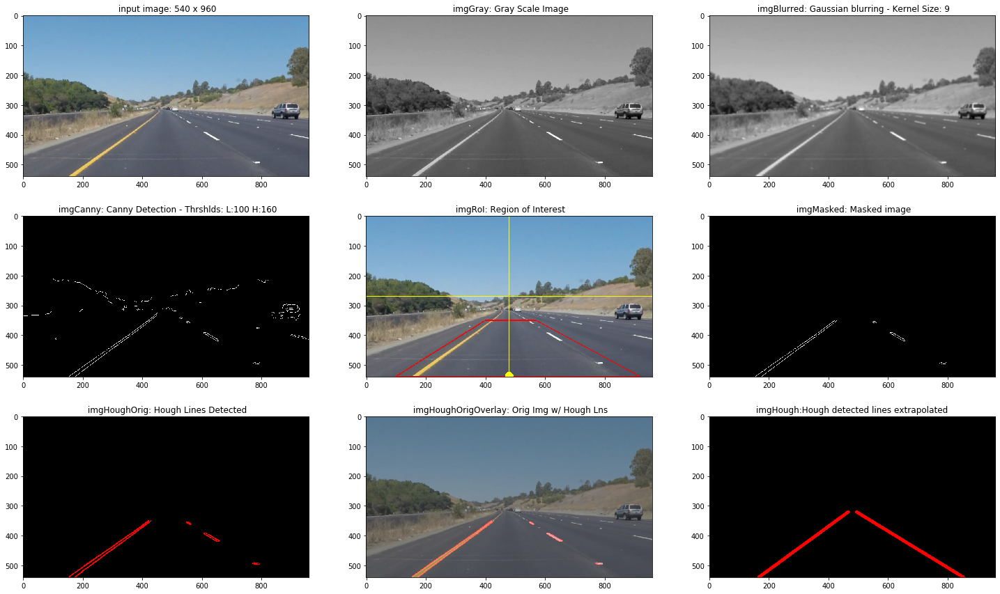

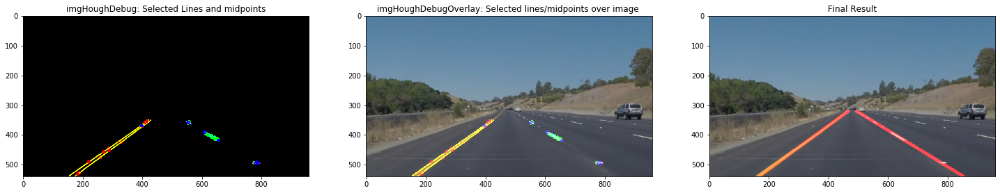

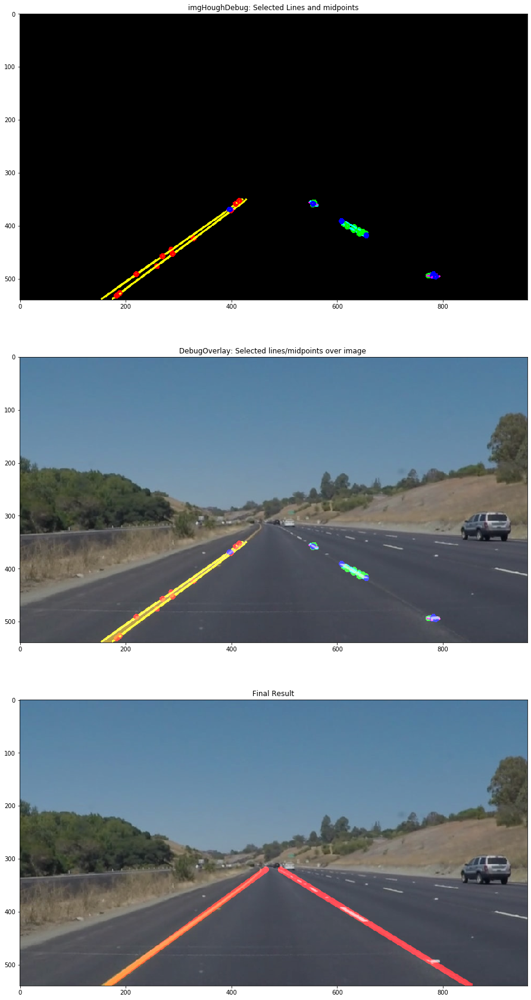

Text(0.5, 1.0, 'solidYellowCurve.jpg with detected lanes')

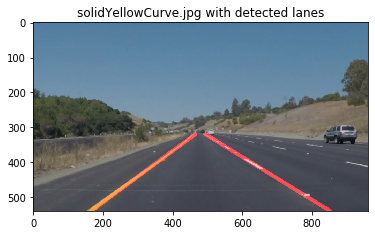

In [9]:
image_id = 2
image = mpimg.imread('test_images/'+images[image_id])
print('Image :', images[image_id], '   with dimensions:', image.shape)    
imgDetected = detect_lanes_pipeline(image, debug= True)
plt.imshow(imgDetected); plt.title(images[image_id]+' with detected lanes')

## Run the pipeline we've created against all 6 images, displaying the final result for each

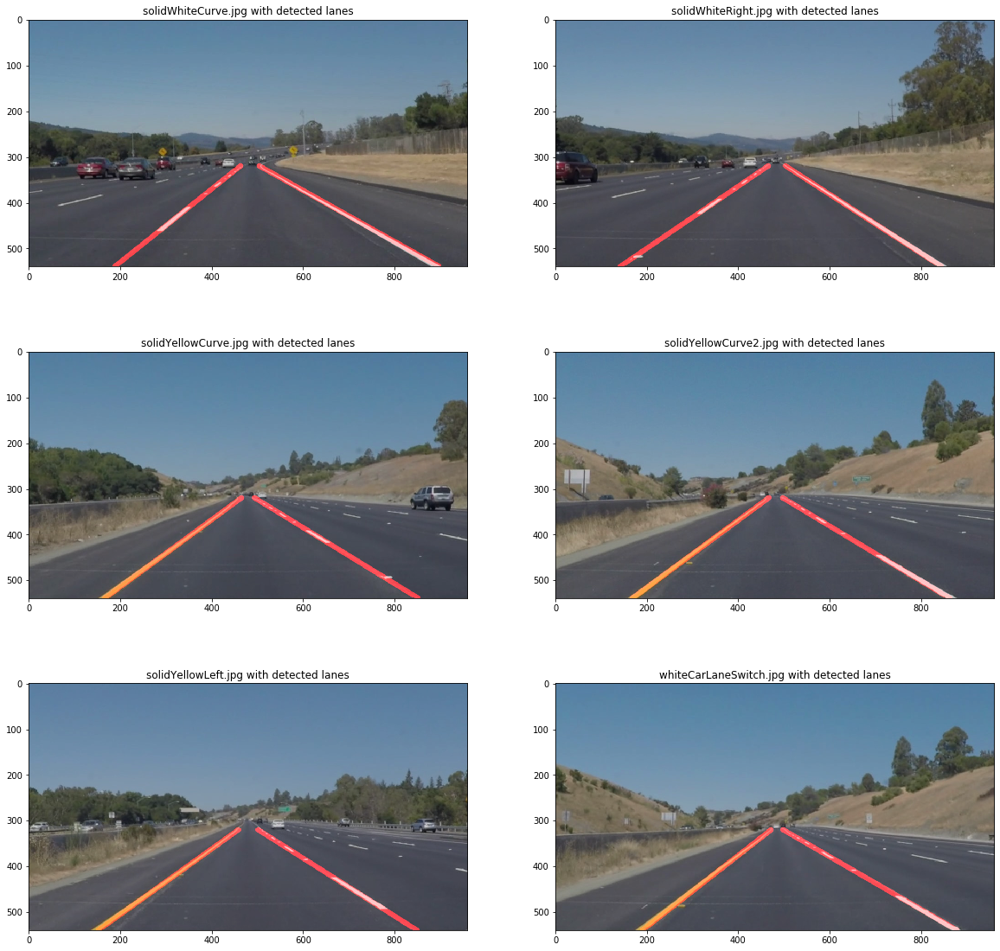

In [11]:
fig = plt.figure(figsize=(20,20))

for image_id in [0,1,2,3,4,5]:
    image = mpimg.imread('test_images/'+images[image_id])  ## Reads in RGB
#     print('Image :', images[image_id], '   with dimensions:', image.shape)    
    imgDetected = detect_lanes_pipeline(image)
    plt.subplot(321+image_id);plt.imshow(imgDetected); plt.title(images[image_id]+' with detected lanes')
    mpimg.imsave('test_images_output/'+images[image_id], imgDetected)

# Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [68]:
# Import everything needed to edit/save/watch video clips
import imageio
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [30]:
videoFiles = ['solidWhiteRight.mp4',
              'solidYellowLeft.mp4',
              'challenge.mp4']

###  Note regarding `process_image()` 

Since I have already converted the developed pipeline into `detect_lanes_pipeline()`, I have reused that here for the `process_image()` function expected.

In [31]:

process_image = detect_lanes_pipeline

## Run selected frame of a video clip through the `process_image()` pipeline to test fuctionality 

In [62]:
video_id = 2  ## video to process
frame_id = 0   ## Frame # to process

cap = cv2.VideoCapture('test_videos/'+videoFiles[video_id]) 
if (cap.isOpened()== False): 
    print("Error opening video stream or file")
print()
print(' Information on :', videoFiles[video_id])
print('-'*(18+len(videoFiles[video_id])))
print(' Current frame: ', cap.get(1)-1, ' time(ms): ', cap.get(0),' Rel pos: ',cap.get(2),' Width: ',cap.get(3),' Height: ',cap.get(4), 'Frame Rate: ',
      cap.get(5),      ' Codec: ', cap.get(6), ' Ttl number of frames: ', cap.get(7))


 Information on : challenge.mp4
-------------------------------
 Current frame:  -1.0  time(ms):  0.0  Rel pos:  0.04  Width:  1280.0  Height:  720.0 Frame Rate:  25.0  Codec:  828601953.0  Ttl number of frames:  251.0


In [63]:
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)
print(cap.get(cv2.CAP_PROP_POS_FRAMES))

0.0


In [64]:
ret, frameBGR = cap.read()

 current frame:  0.0  curr pos(ms):  0.0 Frame Rate:  25.0  Ttl frames:  251.0
RoI vertices     :  [(520, 470), (780, 470), (1150, 670), (180, 670)]
 left lines:
line:  [487, 536, 558, 491]  delta x:  71 delta y: -45 length : 84.06  tan(theta) =  -0.634  theta:  -32.367 (522, 513)
line:  [354, 617, 459, 548]  delta x:  105 delta y: -69 length : 125.642  tan(theta) =  -0.657  theta:  -33.311 (406, 582)
line:  [467, 541, 580, 470]  delta x:  113 delta y: -71 length : 133.454  tan(theta) =  -0.628  theta:  -32.142 (523, 505)
line:  [456, 559, 473, 548]  delta x:  17 delta y: -11 length : 20.248  tan(theta) =  -0.647  theta:  -32.905 (464, 553)
line:  [385, 609, 461, 557]  delta x:  76 delta y: -52 length : 92.087  tan(theta) =  -0.684  theta:  -34.38 (423, 583)
line:  [287, 663, 352, 620]  delta x:  65 delta y: -43 length : 77.936  tan(theta) =  -0.662  theta:  -33.486 (319, 641)
line:  [308, 665, 353, 634]  delta x:  45 delta y: -31 length : 54.644  tan(theta) =  -0.689  theta:  -34.563 

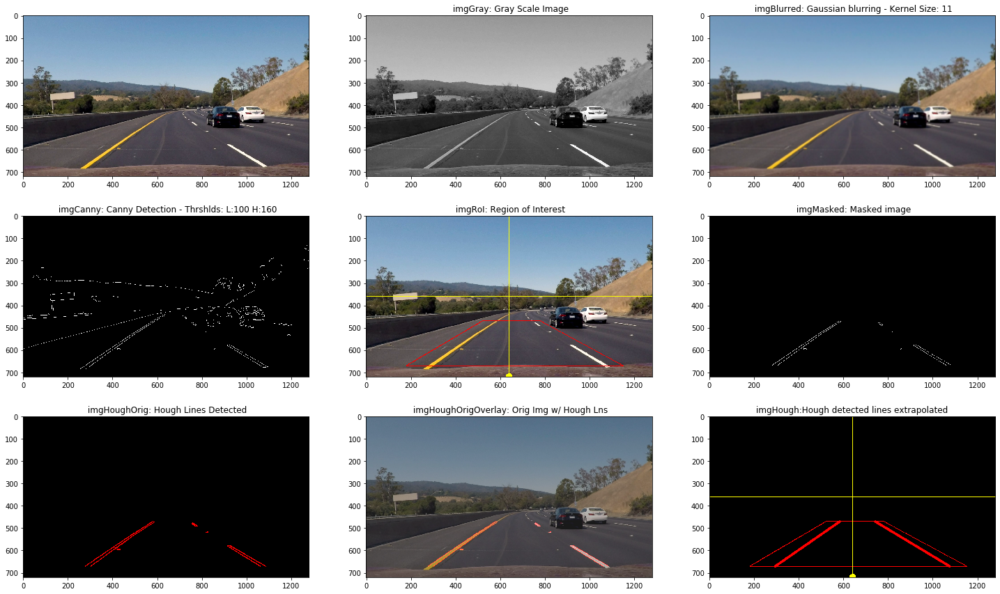

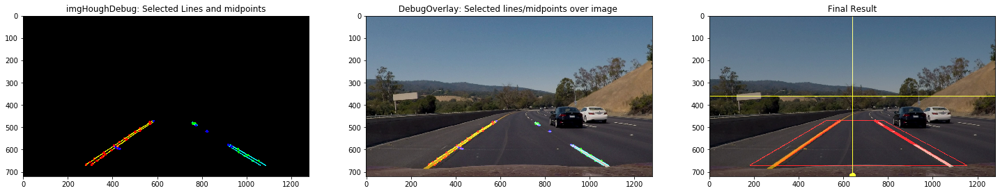

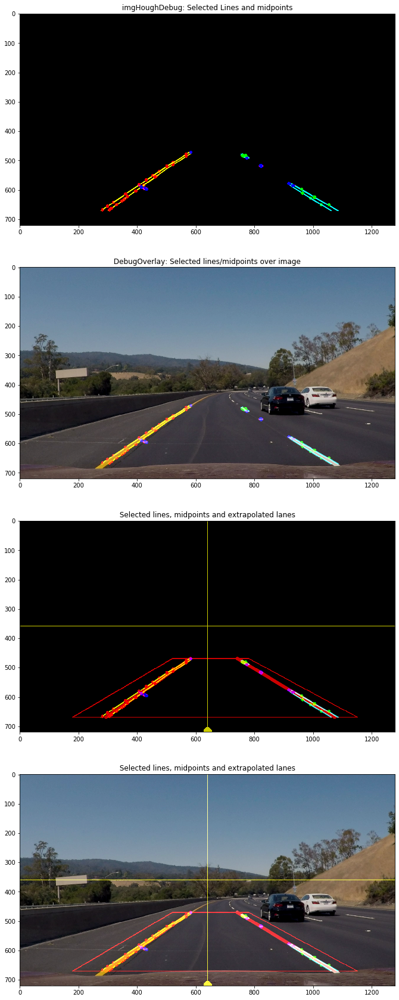

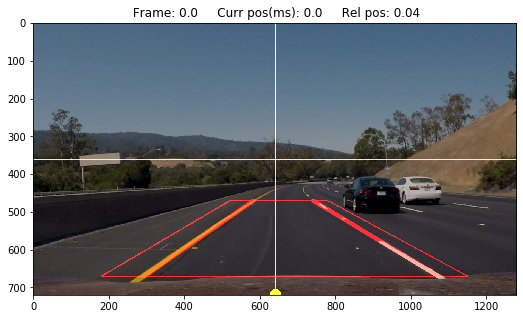

In [65]:
frameRGB = cv2.cvtColor(frameBGR, cv2.COLOR_BGR2RGB)
next_frame = cap.get(1)
print(' current frame: ', next_frame-1, ' curr pos(ms): ', cap.get(0), 'Frame Rate: ',cap.get(5), ' Ttl frames: ', cap.get(7))

# imgDetected = process_image(frameRGB, debug= True)
imgDetected = process_image_modified(frameRGB, debug= True)

fig = plt.figure(figsize=(20,5))
plt.imshow(imgDetected); plt.title(' Frame: '+str(next_frame-1)+'     Curr pos(ms): '+ str(round(cap.get(0),1)) + '     Rel pos: '+ str(cap.get(2))); plt.show()

cap.release()

###  (optional) write output frame

In [66]:
output_frame = str.split(videoFiles[video_id],'.')[0]+'_frame_'+str(frame_id)+'.jpg'
output_frame = 'test_videos_output/' + output_frame

mpimg.imsave(output_frame, imgDetected)
print(' Frame written to : ', output_frame)

 Frame written to :  test_videos_output/challenge_frame_0.jpg


### Run a sequence of video frames through the `process_image()` pipeline, displaying results for each individual frame

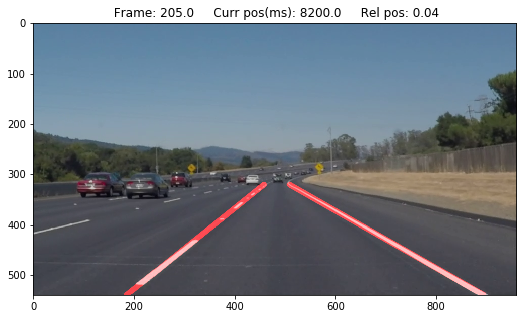

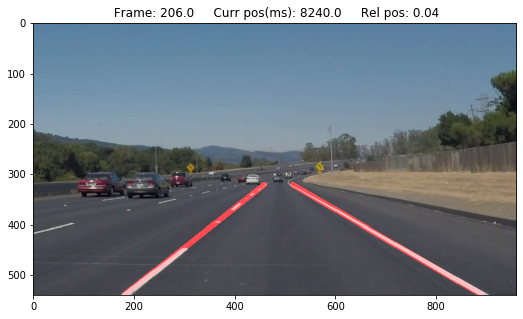

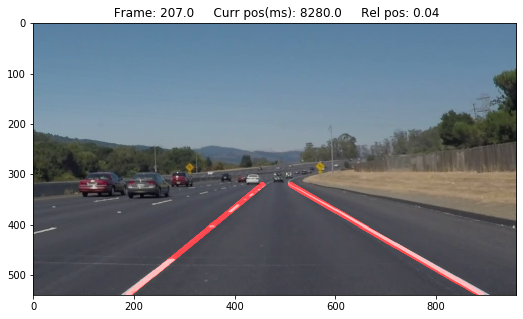

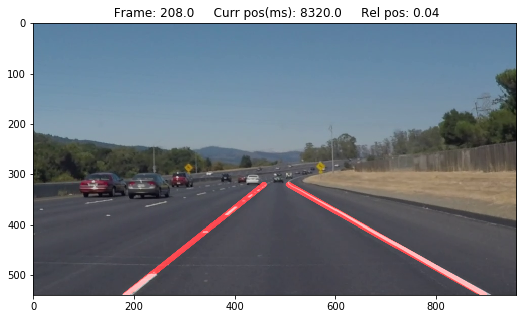

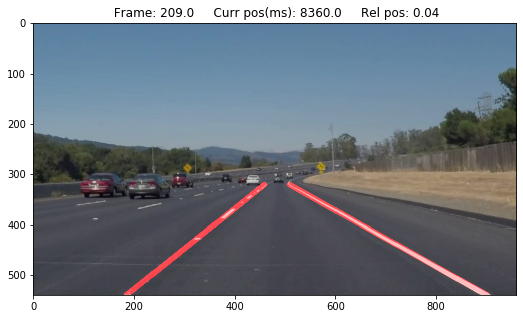

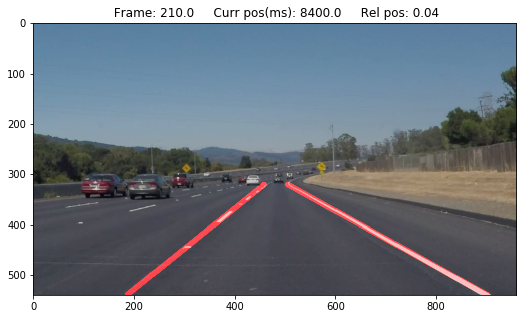

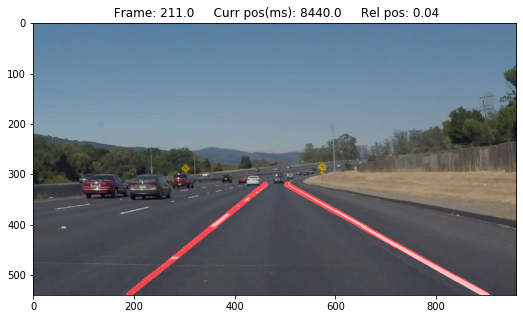

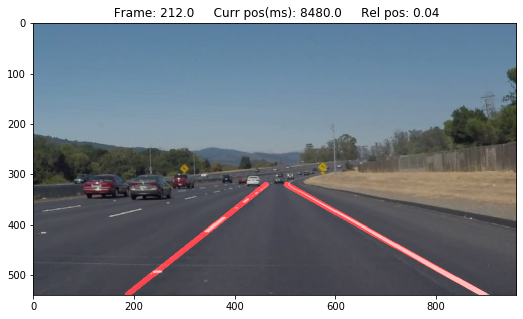

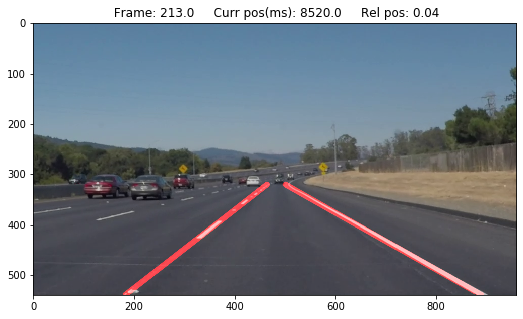

In [27]:
# del  frameBGR, frameRGB, next_frame, end_frame
next_frame = 205
end_frame  = 213

cap = cv2.VideoCapture('test_videos/solidWhiteRight.mp4')
if (cap.isOpened()== False): 
  print("Error opening video stream or file")
cap.set(cv2.CAP_PROP_POS_FRAMES, next_frame)

while cap.isOpened() and (next_frame <= end_frame) :
    ret, frameBGR = cap.read()
    frameRGB = cv2.cvtColor(frameBGR, cv2.COLOR_BGR2RGB)
    next_frame = cap.get(1)
    imgDetected = process_image(frameRGB, debug= False)
    
    fig = plt.figure(figsize=(10,5))
    plt.imshow(imgDetected); plt.title(' Frame: '+str(next_frame-1)+'     Curr pos(ms): '+ str(round(cap.get(0),1)) + '     Rel pos: '+ str(cap.get(2))); plt.show()

cap.release()

## Video 1
Let's try the one with the solid white lane on the right first ...

In [69]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!


In [70]:
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 221/222 [00:04<00:00, 51.66it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

Wall time: 4.83 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [71]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [72]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)

In [73]:
%time yellow_clip.write_videofile(yellow_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 681/682 [00:13<00:00, 48.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidYellowLeft.mp4 

Wall time: 14.5 s


In [74]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


# Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

### Note: 
Modified pipeline code is presented below as `process_image_modified()`, `draw_lines_v3()`, and `hough_lines_v3()` for demonstration purposes. This code can easily be refactored into the solution code above. 

In [75]:
challenge_output = 'test_videos_output/challenge_first_try_2.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge_first_try_2.mp4
[MoviePy] Writing video test_videos_output/challenge_first_try_2.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 251/251 [00:09<00:00, 27.38it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_first_try_2.mp4 

Wall time: 10.2 s


In [76]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

### Discussion

There are two main issues we encounter when processing the Challenge Video,

- different dimensions in the input frame: 
    This necessitates parameterizing the RoI and Camera location, based on the input frame dimensions. This information also needs to be passed on to the hough_lines and  draw_lines routine so that line extrapolation can be performed with this information in mind.

- Wide variations in the pavement color which makes the detection of the yellow lane more challenging, as well as introducing false gradient changes
  passing the color image to the Canny Detection (without conversion to gray scale) helps with the yellow line detection.
  The false gradient detections (especially in frames 109 and 110) also cause difficulty in lane detection in these frames

## Modified Pipeline for Optional Challenge Video

In [82]:
def process_image_modified(image, 
                            blurKernel = 11, cannyLowThreshold=100, cannyHighThreshold=160,
                            houghThreshold = 5, minLineLen = 5, maxLineGap = 20, rho = 1, theta = np.pi/ 180, 
                            debug = False):                            

    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    ## STEP 1: Convert image to gray scale
    imgGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     print('This image is:', type(imgGray), 'with dimensions:', imgGray.shape)
    
    
    ## STEP 2: Gaussian Blurring
    imgBlurred = gaussian_blur(image, blurKernel)
        
    ## STEP 3: Canny detection (80,140)
    imgCanny      = canny(imgBlurred, cannyLowThreshold, cannyHighThreshold)


    ## STEP 4: define region of interest and call masking fuction
    height, width, _   = image.shape
    camera_x           = width //2
    camera_y           = height - 50
    x_offset_top_left  = 120
    x_offset_top_right = 140
    
    x_offset_bot_left  = 460
    x_offset_bot_right = 510
    
    y_offset_top       = 470 ## (6*height)//10
    y_offset_bottom    = camera_y
    RoI_info           = [camera_x,camera_y, y_offset_top, y_offset_bottom]

    RoI_top_left       = (camera_x - x_offset_top_left , y_offset_top)
    RoI_top_right      = (camera_x + x_offset_top_right, y_offset_top)
    RoI_bot_left       = (camera_x - x_offset_bot_left , y_offset_bottom)
    RoI_bot_right      = (camera_x + x_offset_bot_right, y_offset_bottom)
    RoI_vertices_list  = [RoI_top_left, RoI_top_right, RoI_bot_right, RoI_bot_left]
    
    if debug:
        print('RoI vertices     : ',RoI_vertices_list)

    RoI_vertices = np.array([RoI_vertices_list],dtype = np.int32)
    ## Mask imgCanny to area defined by RoI vertices
    imgMasked = region_of_interest(imgCanny, RoI_vertices)

    ## STEP 5: Hough Tranformation 

    ## Run new hough_lines function, detecting extrapolated lanes
    ## Overlay and display Hough Transformed image over original image:
    
    imgHough, imgHoughDebug = hough_lines_v3(imgMasked, rho, theta, houghThreshold, 
                                             minLineLen, maxLineGap, RoI_info, debug = debug)
    
#     draw_roi(imgHough, RoI_vertices_list)
#     draw_guidelines(imgHough)

    result = weighted_img(imgHough, image, α=0.7, β=0.9, γ=0.)

    if debug:
        ## Display intermediate results
        fig = plt.figure(figsize=(25,15))
        plt.subplot(331);plt.imshow(image)
        plt.subplot(332);plt.imshow(imgGray, cmap = 'gray'); plt.title(' imgGray: Gray Scale Image')
        plt.subplot(333);plt.imshow(imgBlurred, cmap = 'gray'); plt.title(' imgBlurred: Gaussian blurring - Kernel Size: '+str(blurKernel))
        plt.subplot(334);plt.imshow(imgCanny, cmap = 'gray'); 
        plt.title(' imgCanny: Canny Detection - Thrshlds: L:'+str(cannyLowThreshold)+ ' H:'+str(cannyHighThreshold))

        imgRoI = np.copy(image)
        imgRoI = draw_roi(imgRoI, RoI_vertices_list)
        imgRoI = draw_guidelines(imgRoI)
        plt.subplot(335);plt.imshow(imgRoI ); plt.title(' imgRoI: Region of Interest')
        plt.subplot(336);plt.imshow(imgMasked , cmap = 'gray'); plt.title(' imgMasked: Masked image')

        ## Run original hough_lines function to obtain image to display in debug mode
        ## Overlay and display Hough Transformed image over original image:
        imgHoughOrig, _ = hough_lines(imgMasked, rho, theta, houghThreshold, minLineLen, maxLineGap, draw_lines_v1)
        imgHoughOrigOverlay = weighted_img(imgHoughOrig, image, α=0.6, β=0.8, γ=25)
        
        plt.subplot(337);plt.imshow(imgHoughOrig, cmap = 'gray'); plt.title(' imgHoughOrig: Hough Lines Detected')
        plt.subplot(338);plt.imshow(imgHoughOrigOverlay ); plt.title(' imgHoughOrigOverlay: Orig Img w/ Hough Lns')
        plt.subplot(339);plt.imshow(imgHough); plt.title(' imgHough:Hough detected lines extrapolated ')
        plt.show()
    
        fig = plt.figure(figsize=(25,5))
        imgHoughDebugOverlay = weighted_img(imgHoughDebug, image, α=0.8, β=0.8, γ=0.)
        plt.subplot(131);plt.imshow(imgHoughDebug); plt.title(' imgHoughDebug: Selected Lines and midpoints ')
        plt.subplot(132);plt.imshow(imgHoughDebugOverlay); plt.title(' DebugOverlay: Selected lines/midpoints over image  ')
        plt.subplot(133);plt.imshow(result); plt.title(' Final Result ')        
        
    if debug:
        fig = plt.figure(figsize=(25,30))
        imgHoughDebugOverlay1 = weighted_img(imgHoughDebug, image, α=0.8, β=1.1, γ=0.)
        imgHoughDebugOverlay2 = weighted_img(imgHoughDebug, imgHough, α=0.8, β=0.9, γ=0.)
        imgHoughDebugOverlay3 = weighted_img(imgHoughDebugOverlay2, image, α=0.8, β=0.9, γ=0.)

        plt.subplot(411);plt.imshow(imgHoughDebug); plt.title(' imgHoughDebug: Selected Lines and midpoints ')
        plt.subplot(412);plt.imshow(imgHoughDebugOverlay1); plt.title(' DebugOverlay: Selected lines/midpoints over image ')
        plt.subplot(413);plt.imshow(imgHoughDebugOverlay2); plt.title(' Selected lines, midpoints and extrapolated lanes ')
        plt.subplot(414);plt.imshow(imgHoughDebugOverlay3); plt.title(' Selected lines, midpoints and extrapolated lanes ')
#         plt.subplot(313);plt.imshow(result); plt.title(' Final Result ')
        plt.show()
    return result

In [83]:
def draw_lines_v3(img, lines, roi_info, color=[255, 0, 0], thickness=2,debug = False):
    """
    This version receives camera and RoI info from the calling function with roi_info parm.
    """
    height, width, _ = img.shape
    camera_x,camera_y, y_offset_top, y_offset_bottom = roi_info

    min_theta      = 20.0
    max_theta      = 90.0

    left_lines     = []   ## only used for debug/display purposes 
    right_lines    = []   ## only used for debug/display purposes 
    other_lines    = []   ## only used for debug/display purposes 
    
    left_midpts    = []
    right_midpts   = []
    other_midpts   = []
    
    right_points   = [] 
    left_points    = [] 
    other_points   = []
    
    sort_on_x      = cmp_to_key(sort_by_x)
    sort_on_y      = cmp_to_key(sort_by_y)
        
    for line in lines:
        for x1,y1,x2,y2 in line:
            delta_x = x2-x1
            delta_y = y2-y1
            x_mp    = x1 + (delta_x//2)
            y_mp    = y1 + (delta_y//2)            
            if delta_x != 0:
                slope   = delta_y / delta_x
                theta   = np.arctan(slope) * 180 / np.pi
            elif delta_y < 0:
                slope   = np.Infinity
                theta   = 90.0
            else:
                slope   = -np.Infinity
                theta   = -90.0

            if (x1 > (camera_x + 20)) and (x2 > (camera_x + 20)) and  (max_theta >= theta > min_theta):
                right_points.extend([[x1,y1],[x2,y2]])
                right_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, theta])
                right_midpts.append((x_mp, y_mp))
            elif (x1 < (camera_x - 20)) and (x2 < (camera_x - 20)) and (-max_theta < theta <= -min_theta):
                left_points.extend([[x1,y1],[x2,y2]])                
                left_lines.append ([x1,y1,x2,y2, (x_mp, y_mp), slope, theta])
                left_midpts.append((x_mp, y_mp))
            else:
                other_points.extend([[x1,y1],[x2,y2]])                
                other_lines.append([x1,y1,x2,y2, (x_mp, y_mp), slope, theta])
                other_midpts.append((x_mp, y_mp))
    
    debug_img = np.copy(img)
    if debug:
        print(' left lines:')
        for line in left_lines:
            x1,y1,x2,y2, mid_pt, slope, theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' theta: ' , round(theta,3), mid_pt)
            cv2.line(debug_img, (x1,y1), (x2,y2), (255,255,0), thickness = 2, lineType=cv2.LINE_AA)  ## yellow
            cv2.circle(debug_img, mid_pt, radius = 3, color=(255,0,0), thickness=4 )  ## Red

        print(' right lines:')
        for line in right_lines:
            x1,y1,x2,y2,  mid_pt, slope, theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' theta: ' , round(theta,3), mid_pt)
            cv2.line(debug_img, (x1,y1), (x2,y2), (0,255,255), thickness = 2, lineType=cv2.LINE_AA)  ## cyan
            cv2.circle(debug_img, mid_pt, radius = 3, color=(0,255,0), thickness=4)   ## Green

        print(' other lines:')
        for line in other_lines:
            x1,y1,x2,y2,  mid_pt, slope, theta = line
            delta_x = x2-x1
            delta_y = y2-y1
            print('line: ', line[:4], ' delta x: ', delta_x, 'delta y:', delta_y, 'length :', round(np.sqrt(delta_x**2+delta_y**2),3), 
                  ' tan(theta) = ', round(slope,3), ' theta: ' , round(theta,3), mid_pt)            
            cv2.line(debug_img, (x1,y1), (x2,y2), (255,0,255), thickness = 2, lineType=cv2.LINE_AA)  ## magenta
            cv2.circle(debug_img, mid_pt, radius = 3, color=(0,0,255), thickness=4)   ## Blue
            
    ## debug image displays

    right_points = sorted(right_points, key = sort_on_y)
    right_midpts = sorted(right_midpts, key = sort_on_y)
    
    left_points  = sorted(left_points, key = sort_on_y)    
    left_midpts  = sorted(left_midpts, key = sort_on_y)
#     right_midpts_two =[right_midpts[0], right_midpts[-1]]
#     left_midpts_two = [left_midpts[0], left_midpts[-1]]
    
    if debug:
        print('\nRight lines: ')
        print('-'*30)
        print('  All points:', right_points)
        print('  mid-points:', right_midpts)
#         print('  first,last mid-points: ', right_midpts_two)
        

    extrapolate_lane(img, right_points, y_offset_top, y_offset_bottom, debug = debug)
    
    if debug:
        print('\nLeft lines: ')
        print('-'*30)
        print('  All points:', left_points)
        print('  mid-points:', left_midpts)
#         print('  first,last mid-points: ', left_midpts_two)
        
    extrapolate_lane(img, left_points, y_offset_top, y_offset_bottom, debug = debug)
    
    return debug_img


def hough_lines_v3(img, rho, theta, threshold, min_line_len, max_line_gap, camera_info, debug = False):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)

    if lines is None:
        debug_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    else:
        debug_img = draw_lines_v3(line_img, lines, camera_info, debug = debug)
    return line_img, debug_img


### Run modified routine on selected specific frames of OPTIONAL CHALLENGE VIDEO to test fuctionality 

In [101]:
show_frame = 106

In [102]:
cap = cv2.VideoCapture('test_videos/challenge.mp4')
# Check if camera opened successfully
if (cap.isOpened()== False): 
  print("Error opening video stream or file")

cap.set(cv2.CAP_PROP_POS_FRAMES, show_frame)
print(cap.get(cv2.CAP_PROP_POS_FRAMES))

106.0


In [103]:
ret, frameBGR = cap.read()

 current frame:  106.0  curr pos(ms):  4240.0 Rel pos:  0.04  W x H:  1280.0  x  720.0 Frame Rate:  25.0  Ttl frames:  251.0
RoI vertices     :  [(520, 470), (780, 470), (1150, 670), (180, 670)]
 left lines:
line:  [336, 670, 521, 515]  delta x:  185 delta y: -155 length : 241.35  tan(theta) =  -0.838  theta:  -39.958 (428, 592)
line:  [437, 575, 480, 538]  delta x:  43 delta y: -37 length : 56.727  tan(theta) =  -0.86  theta:  -40.711 (458, 556)
line:  [473, 554, 518, 516]  delta x:  45 delta y: -38 length : 58.898  tan(theta) =  -0.844  theta:  -40.179 (495, 535)
line:  [317, 668, 459, 557]  delta x:  142 delta y: -111 length : 180.236  tan(theta) =  -0.782  theta:  -38.014 (388, 612)
line:  [339, 669, 407, 612]  delta x:  68 delta y: -57 length : 88.73  tan(theta) =  -0.838  theta:  -39.971 (373, 640)
line:  [537, 504, 542, 499]  delta x:  5 delta y: -5 length : 7.071  tan(theta) =  -1.0  theta:  -45.0 (539, 501)
line:  [540, 502, 551, 493]  delta x:  11 delta y: -9 length : 14.213 

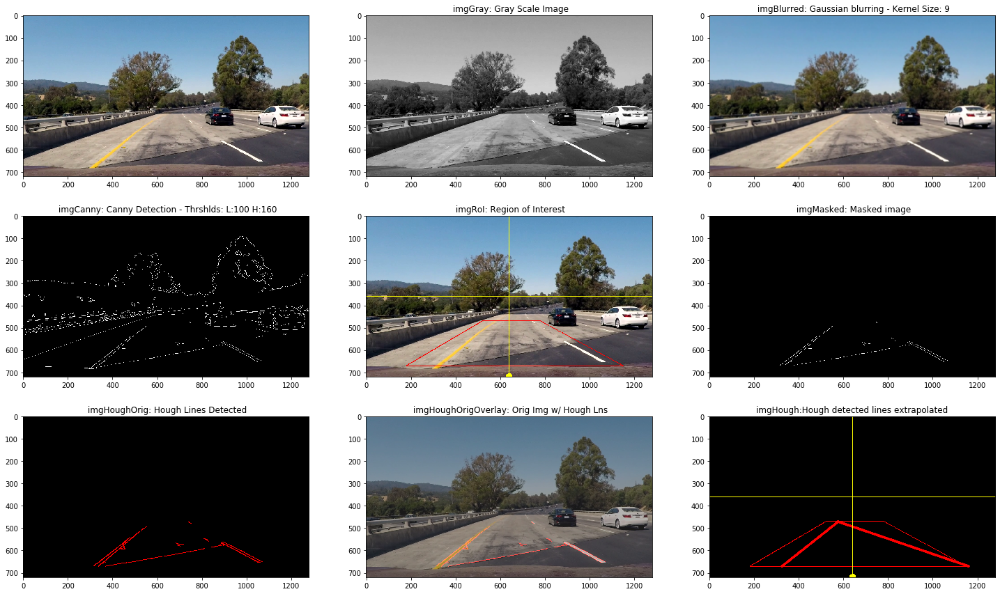

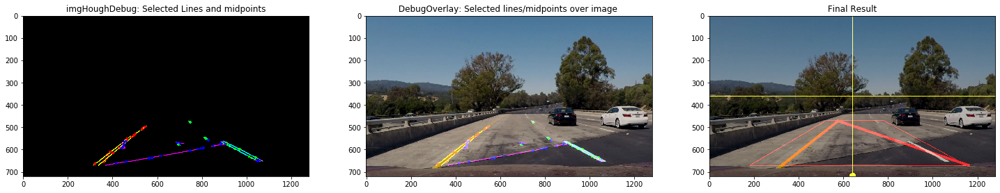

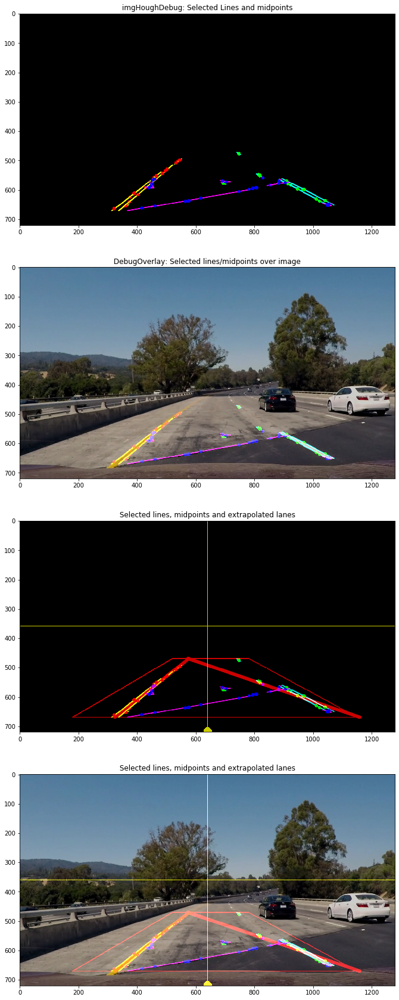

Text(0.5, 1.0, ' frame 106.0 with detected lanes')

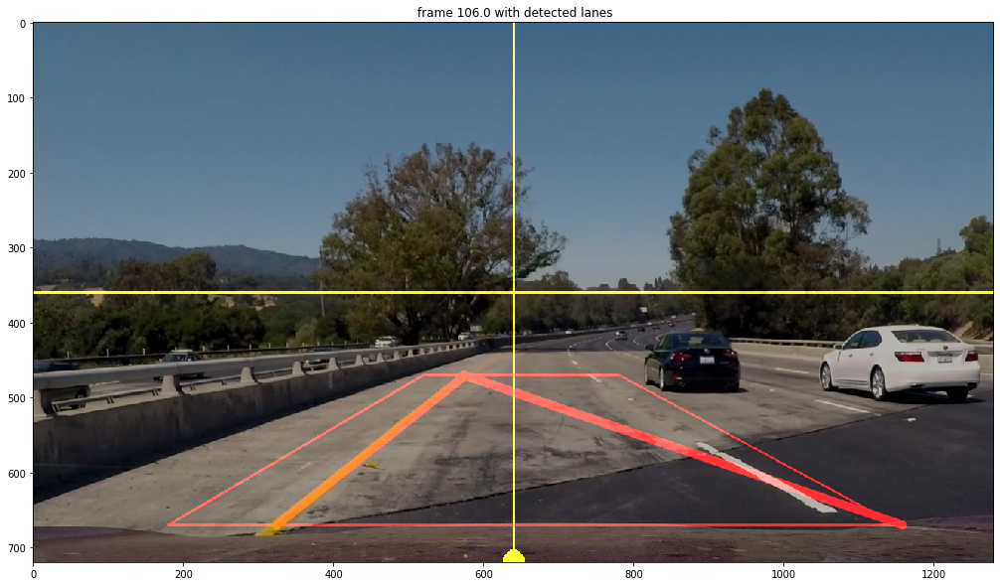

In [104]:
image = cv2.cvtColor(frameBGR, cv2.COLOR_BGR2RGB)
curr_frame = cap.get(1)-1
print(' current frame: ', curr_frame, ' curr pos(ms): ', cap.get(0), 'Rel pos: ',cap.get(2),' W x H: ',cap.get(3),' x ',cap.get(4), 
      'Frame Rate: ',cap.get(5), ' Ttl frames: ', cap.get(7))

imgDetected = process_image_modified(image, blurKernel= 9, debug= True)
fig = plt.figure(figsize=(20,10))
plt.imshow(imgDetected); plt.title(' frame '+str(curr_frame)+' with detected lanes')

### Process and display a series of video frames

 Current frame:  -1.0  time(ms):  0.0  Rel pos:  0.04  Width:  1280.0  Height:  720.0 Frame Rate:  25.0  Codec:  828601953.0  Ttl number of frames:  251.0


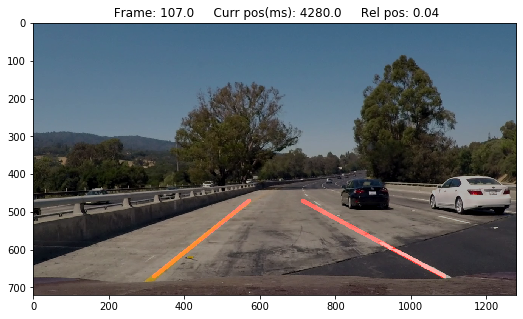

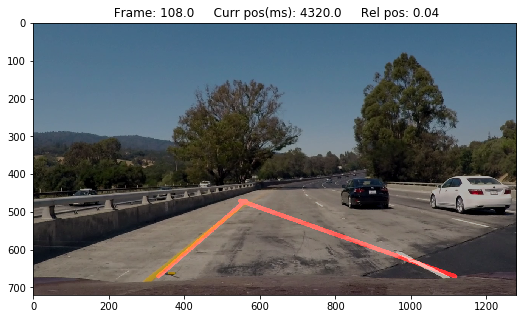

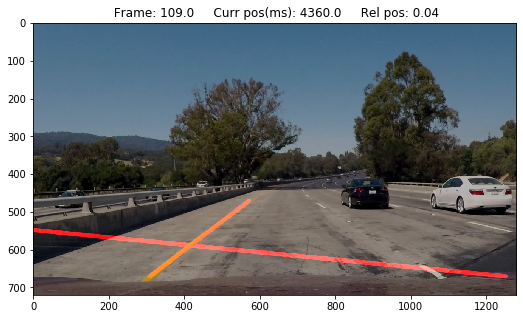

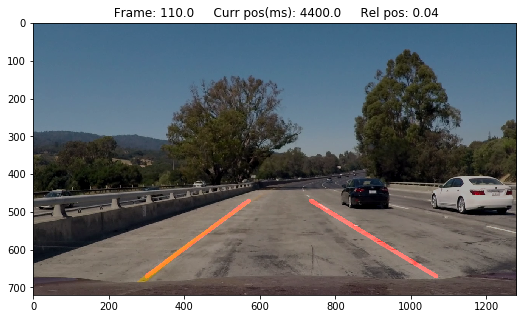

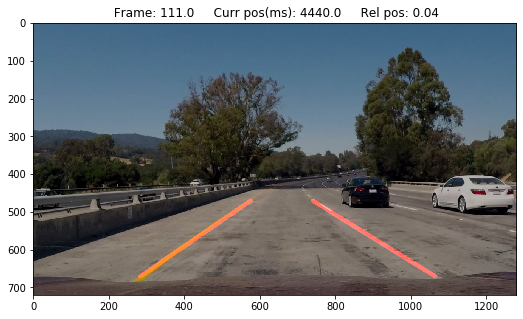

In [75]:
# del  frameBGR, frameRGB, next_frame, end_frame
next_frame = 107
end_frame  = 111

cap = cv2.VideoCapture('test_videos/challenge.mp4')
if (cap.isOpened()== False): 
  print("Error opening video stream or file")

print(' Current frame: ', cap.get(1)-1, ' time(ms): ', cap.get(0),' Rel pos: ',cap.get(2),' Width: ',cap.get(3),' Height: ',cap.get(4), 'Frame Rate: ',cap.get(5),
      ' Codec: ', cap.get(6), ' Ttl number of frames: ', cap.get(7))
cap.set(cv2.CAP_PROP_POS_FRAMES, next_frame)

while cap.isOpened() and (next_frame <= end_frame) :
    ret, frameBGR = cap.read()
    next_frame = cap.get(1)
    
    frameRGB = cv2.cvtColor(frameBGR, cv2.COLOR_BGR2RGB)

    imgDetected = process_challenge_image(frameRGB, blurKernel = 11, debug= False)
    fig = plt.figure(figsize=(10,5))
    plt.imshow(imgDetected); plt.title(' Frame: '+str(next_frame-1)+'     Curr pos(ms): '+ str(round(cap.get(0),1)) + '     Rel pos: '+ str(cap.get(2))); plt.show()


##  Run challenge video with modified code

In [84]:
challenge_output_modified = 'test_videos_output/challenge_modified_wo_guidelines.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)

clip4 = VideoFileClip('test_videos/challenge.mp4')

challenge_clip_modified = clip4.fl_image(process_image_modified)

In [85]:
%time challenge_clip_modified.write_videofile(challenge_output_modified, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge_modified_wo_guidelines.mp4
[MoviePy] Writing video test_videos_output/challenge_modified_wo_guidelines.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 251/251 [00:09<00:00, 25.33it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_modified_wo_guidelines.mp4 

Wall time: 11 s


In [86]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output_modified))

## Miscellaneous Code

#### Tuning Canny Thresholds

In [ ]:
# def test_canny_parms(image, debug = False):
## STEP 1 : Convert image to gray scale
imgGray = grayscale(image)

## STEP 2: Gaussian Blurring
blurKernel = 9
imgBlurred = gaussian_blur(imgGray, blurKernel)

i      = 0 
rows   = 3
cols   = 3

fig = plt.figure(figsize=(cols * 8, rows * 5))


## STEP 3: Canny detection
for lowThreshold  in [50, 100, 150]:
    for highThreshold in [100, 150, 200]:
        imgCanny      = canny(imgBlurred, lowThreshold, highThreshold)
        ax = fig.add_subplot(rows, cols, 1+i);ax.imshow(imgCanny,cmap='gray'); ax.set_title('Canny Detection- Thrshlds: Low: '+str(lowThreshold)+ ' High: '+str(highThreshold))
        i += 1

#### Tuning Hough Transformation parameters 

In [ ]:
image_id = 5
image = mpimg.imread('test_images/'+images[image_id])
print('Image :', images[image_id], '   with dimensions:', image.shape)  

In [ ]:
cap = cv2.VideoCapture('test_videos/challenge.mp4')
# Check if camera opened successfully
if (cap.isOpened()== False): 
  print("Error opening video stream or file")

# retval=cap.set(cv2.CAP_PROP_POS_MSEC, 70.0)
# print(retval)
# print(cap.get(cv2.CAP_PROP_POS_MSEC))

print(cap.get(cv2.CAP_PROP_POS_FRAMES))
cap.set(cv2.CAP_PROP_POS_FRAMES, 103)
print(cap.get(cv2.CAP_PROP_POS_FRAMES))

In [ ]:
ret, frameBGR = cap.read()
image = cv2.cvtColor(frameBGR, cv2.COLOR_BGR2RGB)

In [ ]:
print(image.shape)
print('current frame: ', cap.get(1)-1, ' time(ms): ', cap.get(0),'    ',cap.get(2),cap.get(3),cap.get(4),cap.get(5),cap.get(6), cap.get(7), cap.get(cv2.CAP_PROP_FRAME_COUNT))
# imgBright = cv2.addWeighted( image,   1.5, image, 0, 50)
# imgGray = cv2.cvtColor(imgBright, cv2.COLOR_BGR2GRAY)

fig = plt.figure(figsize=( 9, 5))
plt.imshow(image);plt.show()

## STEP 1 : Convert image to gray scale
imgGray = grayscale(image)

## STEP 2: Gaussian Blurring
blurKernel = 11
imgBlurred = gaussian_blur(imgGray, blurKernel)

## STEP 3: Canny detection
lowThreshold  = 100
highThreshold = 160
imgCanny      = canny(imgBlurred, lowThreshold, highThreshold)


## STEP 4: Define region of interest and call masking fuction
height, width, _   = image.shape
camera_x           = width //2
camera_y           = height
x_offset_top_left  = 80
x_offset_top_right = 90
y_offset_top       = 350

x_offset_bot_left  = 380
x_offset_bot_right = 440
y_offset_bottom    = image.shape[0]

RoI_vertices_list = [(camera_x - x_offset_bot_left , y_offset_bottom-1), 
                     (camera_x - x_offset_top_left , y_offset_top), 
                     (camera_x + x_offset_top_right, y_offset_top), 
                     (camera_x + x_offset_bot_right, y_offset_bottom-1) ]
RoI_vertices      = np.array([RoI_vertices_list],dtype = np.int32)
imgMasked = region_of_interest(imgCanny, RoI_vertices)


fig = plt.figure(figsize=( 9, 5))
plt.imshow(imgMasked, cmap='gray');plt.show()


i      = 0 
rows   = 4
cols   = 3
fig = plt.figure(figsize=(cols * 8, rows * 5))


## STEP 5: Hough Tranformation 
rho           = 1
theta         = np.pi / 180
threshold     = 5
min_line_len  = 5
max_line_gap  = 20


## STEP 3: Canny detection
# for min_line_len  in [5, 20, 50]:
for min_line_len  in [5, 15, 30]:
#     for max_line_gap in [20,30, 40, 50]:

# for max_line_gap in [10,30,50]:
# for threshold in [5,15,30]:
        ## Run original hough_lines function
        ## Overlay and display Hough Transformed image over original image:
        imgHoughOrig = hough_lines(imgMasked, rho, theta, threshold, min_line_len, max_line_gap, draw_lines_v1)        
        ax = fig.add_subplot(rows, cols, 1+i);ax.imshow(imgHoughOrig); 
        ax.set_title(' Hough Trans. Thrshld: '+str(threshold)+' min_len: '+str(min_line_len)+' max_gap: '+str(max_line_gap), fontsize=15)
        i += 1
plt.tight_layout()